# 1 - Data and Library Loading

In [72]:
import sklearn
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import random
from sklearn.cluster import KMeans
random.seed(1)

1/ Load and plot the training data. Which model seems to have generated the data? In particular, how many "centroids" can you count?

In [73]:
data_train = np.genfromtxt('train.dat', delimiter=" ", dtype='f8')
data_test = np.genfromtxt('test.dat', delimiter=" ", dtype='f8')
n_point, n_dimension = data_train.shape
n_state = 4

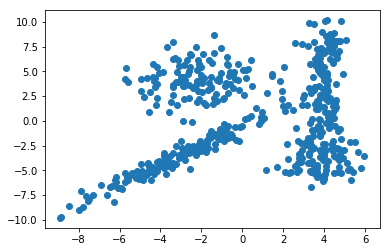

In [74]:
plt.scatter(data_train[:,0], data_train[:,1])
plt.show()

# 2 First approach: k-means algorithm

2/ Use the $k$-means algorithm in order to cluster the data into $K$ classes stored in vector $z\in\{0,1,2,3\}^T$. Return the the vector $\tau \in \{0,1\}^{T \times K}$ such that
$
\tau_{t,k} = 
\begin{cases}
1 & \text{if}\;\;z_t=k\\
0 & \text{otherwise}.
\end{cases}
$

Hint: use the $\texttt{sklearn}$ library.

In [75]:
def kmeans(x, K):
    """
    inputs:
    x : [T,D], T points of dimension D 
    K : integer, number of clusters
    outputs:
    tau [T,k] output, one-hot encoding of the clustering in k classes
    """
    T = x.shape[0]
    kmeans = KMeans(n_clusters=K, random_state=0).fit(x)
    z = kmeans.labels_
    tau = np.zeros((T, K),dtype='f8')
    for i in range(T):
        for j in range(K):
            if z[i] == j:
                tau[i,j] = 1
    #FILL TAU
    return tau

In [76]:
# T = 5
# K = 10
# z = np.random.randint(0,4,10)
# print(z)
# tau = np.zeros((T, K),dtype='f8')
# for i in range(T):
#     for j in range(K):
#         if z[i] == j:
#             tau[i,j] = 1
# print(tau)

3/ Compute and plot the k-means affectation for $K=4$. <font color=red> What assumption of the $k$-means algorithm is not well-suited to the data?

In [77]:
def plot_affectation(x, cluster_indices):
    colors = ['k', 'r', 'g', 'b']
    markers = [ 'o', 's', '+', 'x']
    for i_state in range(n_state):
        plt.scatter(x[cluster_indices==i_state,0], x[cluster_indices==i_state,1], c=colors[i_state], marker=markers[i_state])

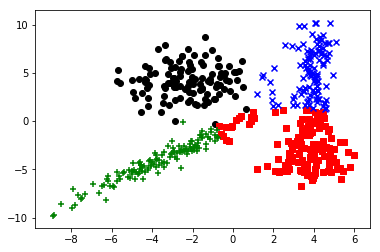

In [78]:
tau = kmeans(data_train, n_state)

c = np.array([])
for i in range(tau.shape[0]):
    t = np.where(tau[i,:] == 1)
    c = np.append(c,t)
plot_affectation(data_train, c)#TODO)

# 3 EM-algorithm for the Gaussian Mixture Model

We first model the data by a Gaussian Mixture Model (GMM): the observed data is comprised of $T$ i.i.d random variables $X_t \mapsto \mathbb{R}^{2}$  which follow a mixture of $K$ Gaussians. The choice of the Gaussian component in the mixture is determined by a latent variable $Z_t \mapsto \{0,\cdots,K-1\}$ following a multinomial distribution.
To each entry $t \in [0,\cdots,T-1]$ we associate an observation $x_t$ and a latent variable $z_t$, and denote by $x\in \mathbb{R}^{T \times 2}$ the vector of $T$ observations and $z\in \{0,\cdots,K-1\}^{T}$ a corresponding vector of latent variables.

$$
p(x,z) = \prod_{t=0}^{T-1} p(x_t,z_t) = \prod_{t=0}^{T-1} p(z_t) p(x_t \mid z_t)~.
$$

The latent variables follow each a multinomial distribution parameterized by $\pi \in \mathbb{R}^K$: 
$$
p(z_t=k) = \pi_k~.
$$
The conditional probability $p(x_t \mid z_t=k)$ follows a Gaussian distribution parameterized by the centroid $\mu_k \in \mathbb{R}^{2}$ and covariance  matrix $\Sigma_k \in \mathbb{R}^{ 2 \times 2}$:
$$
p(x_t\mid z_t=k) \sim \frac1{(2\pi)^{D/2} \mid\Sigma_i\mid^{1/2}}
\exp{\left(-\frac12(x_t-\mu_k)^\intercal \Sigma_k^{-1} (x_t-\mu_k)\right)},
$$

5 / Draw the model in plate notation.

6 / Complete the function $\texttt{log_gaussian}(x, mu, Sigma)$ which returns the logarithm of the emission probability of value $x$ by a normal distribution parameterized by $\mu$ and $\Sigma$. Run the test cell to check if your code is correct.

Hint: use `np.linalg.det` and `np.linalg.inv`

In [79]:
def log_gaussian(x, mu, Sigma):
    """
    inputs:
    x : [T,D], input T points of dimension D
    mu : [D,], centroid
    Sigma : [D,D], centroid
    outputs:
    float, log probability of x being generated by the gaussian N(mu, sigma)
    """
    vec_diff = x - mu
    print(vec_diff)
    D = x.shape[1]
    l = vec_diff @ np.linalg.inv(Sigma) @ vec_diff.T
    log_px = (-0.5 * D * np.log(2*np.pi)) - (0.5 * np.log(np.linalg.det(Sigma))) - (0.5 * np.diag(l)) 
#     print(log_px)
    return log_px#TODO

In [80]:
#the next assert checks the correcteness of the log-gaussian function's code! the assert must pass
mu = np.array([1,1])
Sigma = np.array([[1,0.5],[0.3,2]])
x = np.array([[1,0],[10,1]])
assert((np.abs(log_gaussian(x, mu, Sigma)-np.array([ -2.41574016, -45.92925367]))<1e-8).all())

[[ 0 -1]
 [ 9  0]]


8 / Complete the function $\texttt{log_all_gaussians}(x, mus, Sigmas)$ which returns $p(x_t \mid z_t=k)$ for all the $k$ Gaussian distributions parameterized by $\mu_k$ and $\Sigma_k$:
$$
[p]_{t,k}=p(x_t \mid z_t=k)
$$

In [81]:
def log_all_gaussians(x, mus, Sigmas):
    """
    inputs:
    x : [T,D] T input points of dimension D
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    outputs:
    [T,K]  probability that each data point x_t was generated by the k-th mixture
    """
    n_state = mus.shape[0]
    log_proba = np.zeros((x.shape[0], n_state),dtype='f8')
    for i_state in range(n_state):
        log_proba[:,i_state] = log_gaussian(x, mus[i_state], Sigmas[i_state,:]) #TODO
    return log_proba

In [82]:
#another code check
mus = np.array([[1,1],[5,5]])
print(mus.shape)
Sigmas = np.array([[[1,0.5],[0.3,2]],[[2,0.5],[0.9,2]]])
x = np.array([[1,0],[10,1]])
assert((np.abs(log_all_gaussians(x, mus, Sigmas)-np.array([[ -2.41574016, -10.07698467], [-45.92925367, -17.96430861]]))<1e-7).all())

(2, 2)
[[ 0 -1]
 [ 9  0]]
[[-4 -5]
 [ 5 -4]]


6 / Complete the function $\texttt{M_step_mixture}$ which implements the M-step of an EM algorithm for a GMM model. This function returns the parameters $\hat{\pi},\hat{\mu}, \hat{\Sigma}$ learnt from the expected latent variables $\tau_{t,k}=p(z_t=k \mid x; \theta_\text{current})$.

Reminder:
$$
\hat{\pi}_k = \frac{\sum_{t=0}^{T-1}\tau_{t,k}}{T} 
$$
$$
\hat{\mu}_k = \frac{\sum_{t=0}^{T-1}\tau_{t,k} x_t}{\sum_{t=0}^{T-1} \tau_{t,k}} 
$$
$$
\hat{\Sigma}_k = \frac{\sum_{t=0}^{T-1}\tau_{t,k} (x_t-\hat{\mu_k})(x_t-\hat{\mu_k})^\intercal}{\sum_{t=0}^{T-1} \tau_{t,k}} 
$$

In [83]:
#M-step
def M_step_mixture(x, tau):
    """
    x : [T,D] T input points of dimension D
    tau : [T,K] expected latent variable
    outputs:
    pi : [K,] the Multinomial parameters of z
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    """
    pi = np.zeros((n_state,),dtype='f8')
    mus = np.zeros((n_state, n_dimension),dtype='f8')
    Sigmas = np.zeros((n_state, n_dimension, n_dimension),dtype='f8')
    tau_sum  = tau.sum(0)
    tau_prod = (tau.T @ x)
    T = tau.shape[0]
    K = tau.shape[1]
    D = x.shape[1]
    pi = tau_sum/ T #TODO
    mus = tau_prod /tau_sum[:,None] #TODO
    for k_state in range(n_state):
        x_diff = (x - mus[k_state,:][None,:])
        for k in range(K):
            Sigmas[k_state,:,:] = (tau[:,k_state].reshape(1,-1) * x_diff.T) @ x_diff/tau_sum[k_state]
            #np.dot((tau[:,k].reshape(-1,1) * x_diff).T, x_diff) #TODO
    print(Sigmas.shape)
    return pi, mus, Sigmas

5/ Compute $\pi, (\mu_k, \Sigma_k)_k, $ with the value of $\tau$ obtained with $k$-means. Use the function $\texttt{plot_model}(\tau, mus, Sigmas)$ to represent the iso-density contour of each Gaussians. <font color=red> Why does it make sens to use the $\tau$ from k-means with an M-step to compute the parameters of the Gaussians.

In [84]:
def plot_model(x, tau, mus, Sigmas):
    def plot_gaussian(mu, Sigma):
        x, y = np.meshgrid(np.linspace(-10, 10, 100),
                       np.linspace(-10, 10, 100))
        def gauss(x,y): return np.exp(log_gaussian(np.array([x,y])[None,:], mu, Sigma)[0])
        vec_gaussian = np.vectorize(gauss)
        plt.contour(x, y, vec_gaussian(x, y),3)
    plt.clf()
    colors = ['k', 'r', 'g', 'b']
    markers = [ 'o', 's', '+', 'x']
    z = tau.argmax(1)
    for k_state in range(n_state):
        plt.scatter(x[z==k_state,0], x[z==k_state,1], c=colors[k_state], marker=markers[k_state])
        plot_gaussian(mus[k_state,:], Sigmas[k_state,:,:])

7/ Complete the function $\texttt{logsumexp}(X)=\log(\sum_k(\exp(X_k)))$ which compute the logarithm of sum on the last dimension of elementwise exponentials of an array in a robust way. Try it on the example below, and explain why the naive approach doesn't work.

<font color=red> Justify why this might be necessary when handling normal distributions.

(4, 2, 2)
[[ -7.76143779 -14.16339661]]
[[ -7.76143779 -14.16339661]]
[[ -7.55941759 -14.16339661]]
[[ -7.35739739 -14.16339661]]
[[ -7.15537718 -14.16339661]]
[[ -6.95335698 -14.16339661]]
[[ -6.75133678 -14.16339661]]
[[ -6.54931658 -14.16339661]]
[[ -6.34729638 -14.16339661]]
[[ -6.14527617 -14.16339661]]
[[ -5.94325597 -14.16339661]]
[[ -5.74123577 -14.16339661]]
[[ -5.53921557 -14.16339661]]
[[ -5.33719537 -14.16339661]]
[[ -5.13517516 -14.16339661]]
[[ -4.93315496 -14.16339661]]
[[ -4.73113476 -14.16339661]]
[[ -4.52911456 -14.16339661]]
[[ -4.32709436 -14.16339661]]
[[ -4.12507415 -14.16339661]]
[[ -3.92305395 -14.16339661]]
[[ -3.72103375 -14.16339661]]
[[ -3.51901355 -14.16339661]]
[[ -3.31699335 -14.16339661]]
[[ -3.11497314 -14.16339661]]
[[ -2.91295294 -14.16339661]]
[[ -2.71093274 -14.16339661]]
[[ -2.50891254 -14.16339661]]
[[ -2.30689234 -14.16339661]]
[[ -2.10487213 -14.16339661]]
[[ -1.90285193 -14.16339661]]
[[ -1.70083173 -14.16339661]]
[[ -1.49881153 -14.16339661]]


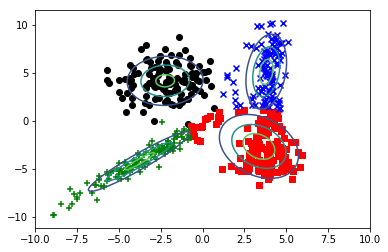

In [85]:
tau=kmeans(data_train, 4)
pi, mus, Sigmas = M_step_mixture(data_train, tau)
plot_model(data_train, tau, mus, Sigmas)

In [86]:
def logsumexp(x):
    """
    #compute log(sum(exp(x))) avoiding numerical underflow
    """    
    max_per_line = x.max(-1, keepdims=True)
    return (max_per_line + np.log(np.sum(np.exp(x-max_per_line),-1, keepdims=True))).squeeze()

In [87]:
test_value = np.array([-1000, -2000, -1001])
naive = np.log(np.sum(np.exp(test_value)))
robust = logsumexp(test_value)
print("naive = %f / robust = %f" % (naive, robust))

naive = -inf / robust = -999.686738


/home/kobbypanfordquainoo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


7 / Complete the function $\texttt{E_step_mixture}(x, \pi, mus, Sigmas)$ which returns the expected latent values $\tau_{t,k}=p(z_t=k \mid x: \theta_\text{current})$ given by the mixture parameterization $\pi, (\mu_k, \Sigma_k)_k$. <font color='red'> Prove that <font color='black'>:
$$
p(z_t=k \mid x; \theta_\text{current})=\frac{p(x_t \mid z_t=k; \theta_\text{current})\;p(z_t=k; \theta_\text{current})}{\sum_{k=0}^{K-1} p(x_t \mid z_t=k; \theta_\text{current})\;p(z_t=k; \theta_\text{current})}
$$

In [97]:
def E_step_mixture(x, pi, mus, Sigmas):
    """
    inputs:
    x : [T,D] T input points of dimension D
    pi : [K,] the Multinomial parameters of z
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    outputs:
    tau : [T,K] expected latent variable
    """
    
    num = log_all_gaussians(x, mus, Sigmas) + np.log(pi)
    
    log_tau = num - logsumexp(num)[:,None]
        
     #TODO
    return np.exp(log_tau)#TODO   

In [98]:
#check that the taus are probabilities
tau = E_step_mixture(data_train, pi, mus, Sigmas)
assert((np.abs(tau.sum(1)-1)<1e-8).all())

[[ 3.14885221e+00 -4.14720461e+00]
 [-2.92437790e-01  2.53470339e+00]
 [ 6.59876221e+00  4.19070339e+00]
 [ 1.53367221e+00 -4.67682661e+00]
 [-3.49973779e+00 -1.03721966e+01]
 [-2.24333779e+00 -8.87609661e+00]
 [ 3.14698221e+00 -3.78137661e+00]
 [ 6.66586221e+00  1.67720339e+00]
 [-3.33383779e+00 -2.05796605e-01]
 [ 6.49456221e+00 -4.87804661e+00]
 [ 3.62262210e-01  1.57403395e-01]
 [ 6.13876221e+00  7.82403395e-01]
 [ 5.87362210e-01 -9.94996605e-01]
 [ 5.64826221e+00 -7.00919661e+00]
 [ 4.98946221e+00 -7.88199661e+00]
 [ 6.24026221e+00 -9.79559661e+00]
 [ 8.62362210e-01 -1.87409661e+00]
 [ 5.40576221e+00 -6.25099661e+00]
 [ 4.80916221e+00  3.67160339e+00]
 [ 6.41686221e+00 -3.69421661e+00]
 [ 8.29162210e-01 -2.48219661e+00]
 [ 5.54176221e+00 -4.39746661e+00]
 [ 1.54866221e+00  1.50980339e+00]
 [ 6.69366221e+00 -3.24361661e+00]
 [ 2.66928221e+00  2.01590339e+00]
 [ 6.48786221e+00  3.64910339e+00]
 [ 2.83622101e-02  9.72503395e-01]
 [ 6.74686221e+00  2.65470339e+00]
 [ 7.00462210e-01  3

8 / Complete the function $\texttt{avg_log_likelihood_mixture}(x)=\log(p(x;\theta_\text{current}))$ which returns the loglikelihood of the vector of observations  $x$ given a Gaussian mixture model parameterized by $\pi, (\mu_k, \Sigma_k)_k$ and normalized by the number of observations.
$$
L(x;\theta_\text{current})=\frac1T \sum_{t=0}^{T-1}\log(p(x_t;\theta_\text{current}))=\frac1T \sum_{t=0}^{T-1}\log\left(\sum_{k=0}^{K-1} p(x_t,z_t=k;\theta_\text{current})\right)
$$

In [96]:
def avg_log_likelihood_mixture(x, pi, mus, Sigmas):
    """
    inputs:
    x : [T,D] T input points of dimension D
    pi : [K,] the Multinomial parameters of z
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    outputs:
    log-likelihood of x
    """
    log_tau_unnormalized = log_all_gaussians(x, mus, Sigmas) + np.log(pi[None,:])#actually did it for you, nothing to complete
    return (logsumexp(log_tau_unnormalized).sum()) / x.shape[0]

9 / Implement the EM algorithm to learn the mixture parameters $\pi, (\mu_k, \Sigma_k)_k$ from the training set with $K=4$. Initialize with $k$-means. Print the likelihood at each step, what do we observe?

In [104]:
def EM_mixture(x):
    """
    inputs:
    x : [T,D] T input points of dimension D
    outputs:
    pi0 : [K,] initial Multinomial
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    tau : [T,K] expected latent variable
    """
    n_ite = 50
    #first E-step
    tau = kmeans(x, 4)
    pi, mus, Sigmas = M_step_mixture(x, tau)
    tau = E_step_mixture(x, pi, mus, Sigmas)
    
    #main loop
    for i_ite in range(n_ite):
        #M-step
        pi, mus, Sigmas = M_step_mixture(x,tau)#TODO
        #E-step
        tau = E_step_mixture(x, pi, mus, Sigmas)  #TODO
        #likelihood
        avg_ll = avg_log_likelihood_mixture(x, pi, mus, Sigmas)
        print("Mixture iteration %d  - loglikelihood = %1.3f" % (i_ite, avg_ll))#TODO))
    return pi, mus, Sigmas, tau

(4, 2, 2)
[[ 3.14885221e+00 -4.14720461e+00]
 [-2.92437790e-01  2.53470339e+00]
 [ 6.59876221e+00  4.19070339e+00]
 [ 1.53367221e+00 -4.67682661e+00]
 [-3.49973779e+00 -1.03721966e+01]
 [-2.24333779e+00 -8.87609661e+00]
 [ 3.14698221e+00 -3.78137661e+00]
 [ 6.66586221e+00  1.67720339e+00]
 [-3.33383779e+00 -2.05796605e-01]
 [ 6.49456221e+00 -4.87804661e+00]
 [ 3.62262210e-01  1.57403395e-01]
 [ 6.13876221e+00  7.82403395e-01]
 [ 5.87362210e-01 -9.94996605e-01]
 [ 5.64826221e+00 -7.00919661e+00]
 [ 4.98946221e+00 -7.88199661e+00]
 [ 6.24026221e+00 -9.79559661e+00]
 [ 8.62362210e-01 -1.87409661e+00]
 [ 5.40576221e+00 -6.25099661e+00]
 [ 4.80916221e+00  3.67160339e+00]
 [ 6.41686221e+00 -3.69421661e+00]
 [ 8.29162210e-01 -2.48219661e+00]
 [ 5.54176221e+00 -4.39746661e+00]
 [ 1.54866221e+00  1.50980339e+00]
 [ 6.69366221e+00 -3.24361661e+00]
 [ 2.66928221e+00  2.01590339e+00]
 [ 6.48786221e+00  3.64910339e+00]
 [ 2.83622101e-02  9.72503395e-01]
 [ 6.74686221e+00  2.65470339e+00]
 [ 7.00462

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[ 3.97188661e+00  3.55038944e+00]
 [ 5.30596615e-01  1.02322974e+01]
 [ 7.42179661e+00  1.18882974e+01]
 [ 2.35670661e+00  3.02076744e+00]
 [-2.67670339e+00 -2.67460256e+00]
 [-1.42030339e+00 -1.17850256e+00]
 [ 3.97001661e+00  3.91621744e+00]
 [ 7.48889661e+00  9.37479744e+00]
 [-2.51080339e+00  7.49179744e+00]
 [ 7.31759661e+00  2.81954744e+00]
 [ 1.18529661e+00  7.85499744e+00]
 [ 6.96179661e+00  8.47999744e+00]
 [ 1.41039661e+00  6.70259744e+00]
 [ 6.47129661e+00  6.88397441e-01]
 [ 5.81249661e+00 -1.84402559e-01]
 [ 7.06329661e+00 -2.09800256e+00]
 [ 1.68539661e+00  5.82349744e+00]
 [ 6.22879661e+00  1.44659744e+00]
 [ 5.63219661e+00  1.13691974e+01]
 [ 7.23989661e+00  4.00337744e+00]
 [ 1.65219661e+00  5.21539744e+00]
 [ 6.36479661e+00  3.30012744e+00]
 [ 2.37169661e+00  9.20739744e+00]
 [ 7.51669661e+00  4.45397744e+00]
 [ 3.49231661e+00  9.71349744e+00]
 [ 7.31089661e+00  1.13466974e+01]
 [ 8.51396615e-01  8.67009744e+00]
 [ 7.56989661e+00  1.03522974e+01]
 [ 1.52349661e+00  7

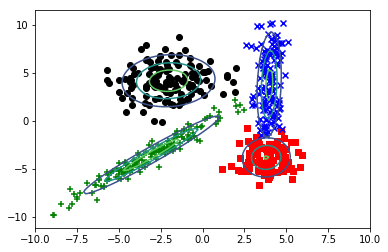

In [105]:
pi, mus, Sigmas, tau = EM_mixture(data_train)
plot_model(data_train, tau, mus, Sigmas)
plt.show()

In [106]:
print("Train loglikelihood = %f" % avg_log_likelihood_mixture(data_train, pi, mus, Sigmas))

[[ 2.94465491e+00 -4.15639600e+00]
 [-4.96635090e-01  2.52551200e+00]
 [ 6.39456491e+00  4.18151200e+00]
 [ 1.32947491e+00 -4.68601800e+00]
 [-3.70393509e+00 -1.03813880e+01]
 [-2.44753509e+00 -8.88528800e+00]
 [ 2.94278491e+00 -3.79056800e+00]
 [ 6.46166491e+00  1.66801200e+00]
 [-3.53803509e+00 -2.14987999e-01]
 [ 6.29036491e+00 -4.88723800e+00]
 [ 1.58064910e-01  1.48212001e-01]
 [ 5.93456491e+00  7.73212001e-01]
 [ 3.83164910e-01 -1.00418800e+00]
 [ 5.44406491e+00 -7.01838800e+00]
 [ 4.78526491e+00 -7.89118800e+00]
 [ 6.03606491e+00 -9.80478800e+00]
 [ 6.58164910e-01 -1.88328800e+00]
 [ 5.20156491e+00 -6.26018800e+00]
 [ 4.60496491e+00  3.66241200e+00]
 [ 6.21266491e+00 -3.70340800e+00]
 [ 6.24964910e-01 -2.49138800e+00]
 [ 5.33756491e+00 -4.40665800e+00]
 [ 1.34446491e+00  1.50061200e+00]
 [ 6.48946491e+00 -3.25280800e+00]
 [ 2.46508491e+00  2.00671200e+00]
 [ 6.28366491e+00  3.63991200e+00]
 [-1.75835090e-01  9.63312001e-01]
 [ 6.54266491e+00  2.64551200e+00]
 [ 4.96264910e-01  2

9 / Compute the log-likelihood of the test data, visualize the data and comment.

[[-2.74203509e+00 -9.24888800e+00]
 [-5.81350898e-02 -6.37618800e+00]
 [ 6.45186491e+00 -4.46180800e+00]
 [-1.25635090e-01 -1.44588800e+00]
 [ 6.12936491e+00  2.27812001e-01]
 [ 2.72499491e+00 -2.14879991e-02]
 [ 6.96096491e+00 -2.41758800e+00]
 [ 2.34315491e+00  1.89031200e+00]
 [ 6.53176491e+00 -6.74348800e+00]
 [ 5.74166491e+00 -8.99788800e+00]
 [ 5.36396491e+00 -1.02589880e+01]
 [ 5.85576491e+00 -9.01388800e+00]
 [ 8.22486491e+00 -9.01518800e+00]
 [ 5.78186491e+00  1.49012001e-01]
 [ 5.32236491e+00 -9.24408800e+00]
 [ 5.73896491e+00 -7.39708800e+00]
 [ 5.19466491e+00 -8.09458800e+00]
 [ 1.81147491e+00 -1.55598800e+00]
 [ 6.19246491e+00 -9.67587999e-01]
 [-1.65583509e+00 -1.30668800e+00]
 [ 6.88306491e+00  1.92911200e+00]
 [ 6.78864910e-01 -1.96388800e+00]
 [ 6.52616491e+00  9.12712001e-01]
 [-3.35503509e+00 -3.47591800e+00]
 [ 6.76626491e+00  4.45901200e+00]
 [-1.28350898e-02 -9.38687999e-01]
 [ 6.04486491e+00 -1.66208800e+00]
 [ 1.75159491e+00 -1.00898800e+00]
 [ 5.37176491e+00  1

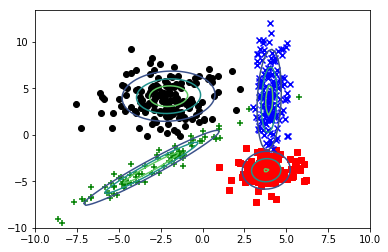

In [107]:
tau = E_step_mixture(data_test, pi, mus, Sigmas)
plot_model(data_test, tau, mus, Sigmas)
print("Test loglikelihood = %f" % avg_log_likelihood_mixture(data_test, pi, mus, Sigmas))

# 4 Hidden Markov Model

10 / We now take into account the temporal structure of the data with a chain-structured hidden Markov model with discrete latent variable $z\in\{0,\cdots,K-1\}^T$:
$$
p(x, z) = p(z_0)\prod_{t=0}^{T-1}  p(x_t \mid z_t)\prod_{t=1}^{T-1} p(z_t \mid z_{t-1}).
$$
We model $p(x_t \mid z_t = k) \sim \mathcal{N}(\mu_k, \Sigma_k)$ like in the previous model, and $p(z_{t+1}=k \mid z_{t}=l)=A_{k,l}$ and finally $p(z_0)$ with a multinomial distribution parameterized by $\pi_0$.

We initialize the Gaussian parameters $\mu_k$ and $\Sigma_k$ with the values $\hat{\mu_k}$ and $\hat{\Sigma_k}$ computed in the mixture model. We initalize $\pi_0$ and $A$ as follows:
$$
\pi_0=\hat{\pi}
$$

$$
[A]_{k,l}=\hat{\pi}_k
$$
Complete the next cell to initialize $A$ and $\pi_0$. <font color = red> How can we interpret this initialization?

In [ ]:
A = #TODO
pi0 = #TODO

10 / Complete the function $\texttt{alpha_beta}(x, pi,mus,Sigmas, A)$ which peforms the marginal inference of the model.

we have the following formulas for the alpha and beta recursions:
$$
\alpha(z_{t}) = p(x_0, \cdots, x_t, z_t)  = p(x_t \mid z_t)\sum_{z_{t-1}=0}^{K-1}\alpha(z_{t-1})\;p(z_{t} \mid z_{t-1})
$$
$$
\beta(z_{t}) = p(x_{t+1}, \cdots, x_T \mid z_t) = \sum_{z_{t+1}=0}^{K-1}\beta(z_{t+1})\;p(z_{t+1}\mid z_{t})\;p(x_t \mid z_{t})
$$

In [ ]:
def alpha_beta(x, pi0, mus, Sigmas, A):
    """
    inputs:
    x : [T,D] T input points of dimension D
    pi0 : [K,] initial Multinomial
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    A : [K,K] transition probability
    outputs:
    log_proba_emission : [T,K] the probability that each data point x_t was generated by the k-th mixture
    alpha, beta : [T,K] 
    """
    T = x.shape[0]
    log_proba_emission = log_all_gaussians(x, mus, Sigmas)

    #forward pass
    log_alpha = np.zeros((T, n_state), dtype=('f8'))
    log_alpha[0,:] = #TODO
    for t in range(1,T):
        log_alpha[t,] = #TODO
    #backward pass
    log_beta = np.zeros((T, n_state), dtype=('f8'))  
    for t in range(T-2,-1,-1):
        log_beta[t,] = #TODO
    return log_proba_emission, log_alpha, log_beta

In [ ]:
log_proba_emission, log_alpha, log_beta = alpha_beta(data_train, pi0, mus, Sigmas, A)

11 / Compute the first order marginal probability $\gamma_t= {p(z_t \mid x)}$. Check that the normalization factor is the same for all $t$. Why is that the case? 
Reminder:
$$
\gamma(z_t)=p(z_t \mid x) \propto {\alpha(z_t)\beta(z_t)}
$$

In [ ]:
#marginal inference - first order
log_gamma_unnormalized = #TODO
normalizing_factor = #TODO
log_gamma = #TODO
#check that the normalizing factor is indeed constant
assert((np.abs(normalizing_factor.std())<1e-8).all())

Plot the evolution of the most likely state for each of the first 100 point and comment. <font color = red> How good was our initialization of $A$?

In [ ]:
z = #TODO
figure(figsize=(12,4))
plt.plot(z[0:100])
plt.show()

12 / Compute the pairwise marginals $\xi(z_{t-1},z_t)=p(z_{t-1},z_{t} \mid x; \theta_\text{current})$.

Reminder:
$$
\xi(z_{t-1},z_t)= \frac{\alpha(z_{t-1}) p(z_t \mid X; \theta_\text{current}) p(z_t \mid z_{t-1}; \theta_\text{current}) \beta(z_t)}{p(x; \theta_\text{current})}
$$

In [ ]:
log_xi = #TODO
#code check: the pair marginals are indeed probabilities
assert((np.abs(np.exp(log_xi).sum(1).sum(1)-1)<1e-10).all())

13 / Complete the function $\texttt{E_step_HMM}(pi,mus,Sigmas, A)$ which returns the singleton and pairwise marginals as well as the averaged loglikelihood of the observation.

In [ ]:
def E_step_HMM(x, pi0, mus,Sigmas, A):
    """
    inputs:
    x : [T,D] T input points of dimension D
    pi0 : [K,] initial Multinomial
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    A : [K,K] transition probability
    outputs:
    log_gamma : [T,K] marginals
    log_xi : [T, K, K] patwise marginals
    avg likelihood, float
    """
    #
    log_proba_emission, log_alpha, log_beta = #TODO
    log_gamma_unnormalized = #TODO

    log_gamma = #TODO
    log_xi = #TODO
    return log_gamma, log_xi, log_likelihood[0]/x.shape[0]

14 / Complete the function $\texttt{M_step_HMM}(\gamma, \xi)$ for the HMM model which returns the parameters $\hat{\mu}_k,\hat{\Sigma}_k, \hat{A}$.

$$
[\hat{A}]_{k,l}=\frac{\sum_{t=0}^{T-2}p(z_{t+1}=k,z_{t}=l \mid x; \theta_\text{current})}{\sum_{t=0}^{T-2}\sum_{j=0}^{K-1} p(z_{t+1}=j,z_{t}=l \mid x; \theta_\text{current})}
$$

In [ ]:
def M_step_HMM(x, log_gamma, log_xi):
    """
    inputs:
    x: [T,D] T input points of dimension D
    log_gamma [T,K] marginals
    log_xi [T, K, K] patwise marginals
    outputs:
    pi0 : [K,] initial Multinomial
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    A : [K,K] transition probability
    """
    pi, mus, Sigmas = #TODO
    A = #TODO
    pi0 = np.exp(log_gamma[0,:])
    return pi0, mus, Sigmas, A

In [ ]:
pi0, mus, Sigmas, A =  M_step_HMM(data_train, log_gamma, log_xi)
#a code check that A is indeed a conditional probability
assert(np.all(np.abs(A.sum(0)-1)<1e-10))

16 / Implement the EM algorithm for the HMM model. Initialize the parameters with EM on the Gaussian mixture model.

In [ ]:
#init with mixture
pi, mus, Sigmas, tau = EM_mixture(data_train)
A = np.tile(pi, (n_state,1))
pi0 = pi
n_ite = 100
#main loop
for i_ite in range(100):    
    #E-step
    log_gamma, log_xi, log_likelihood = #TODO
    print("HMM iteration %d  - likelihood = %1.3f" % (i_ite, log_likelihood))
    #M-step
    pi0, mus, Sigmas, A = #TODO
    
plot_model(data_train, np.exp(log_gamma), mus, Sigmas)
plt.show()

18/ Compute the final loglikelihood on the training set and compare it to the one obtained with the mixture model. <font color='red'> Is it a surprising result? Explain why? Make the same comparison on the test set. What conclusion can we draw now?</font>

In [ ]:
_log_gamma, _log_xi, log_likelihood_train = E_step_HMM(data_train, pi0, mus, Sigmas, A)
_log_gamma, _log_xi, log_likelihood_test = E_step_HMM(data_test, pi0, mus, Sigmas, A)
print("likelihood train %1.3f  - likelihood test= %1.3f" % (log_likelihood_train, log_likelihood_test))

19/ <font color = red> If we didn't know in advance the number of states, how would we choose it?

20 / Implement the Viterbi algorithm for MAP inference / decoding. <font color = red> Explain the difference between marginal and MAP inference.
</font>

Reminder:
the Viterbi algorithm is also called max-product. It computes the sequence of state with the maximum likelihood. It defines $p^\text{map}_{t,i}$ as the probability that the most probable path $0\cdots,t$ end in state $i$. We have the following recursion:
$$
p^\text{map}_{t,i} = p(x_t,z_t=i;\theta_\text{current}) \;\max_j( p^\text{map}_{t-1,j}\; p(z_t=i \mid z_{t-1}=j;\theta_\text{current})
$$
Once $p^\text{map}_{T,i}$ is computed, the last state of the map sequence is $\text{argmax}(p^\text{map}_{T,i})$. To compute the previous state, one simply backtrack through the selected transition computed earlier (keep track of the argmax!).

In [ ]:
def viterbi(x, pi0, mus, Sigmas, A):
    """
    inputs:
    pi0 : [K,] initial Multinomial
    mus : [K,D] the K centroids
    Sigmas : [K,D,D] the K covariances
    A : [K,K] transition probability
    outputs:
    map_state T, the MAP affectation
    best_previous_state : the argmax of each max-product
    """
    T = x.shape[0]
    log_proba_emission = #TODO
    map_state = np.zeros((T,), dtype='uint8') #the map sequence
    best_proba = np.zeros((T,n_state), dtype='f8') #probability of best sequence 1..t being in state i
    best_previous_state = np.zeros((T,n_state), dtype='uint8') #state of the previous observation in the best sequence 1..t
    #init
    best_proba[0,:] = #TODO
    best_previous_state[0,:] = np.NaN #no previous observation
    #forward pass
    for t in range(1,T):
        proba_previous_state = #TODO
        best_proba[t,] = #TODO
        best_previous_state[t,] = np.argmax(proba_previous_state,1)
    #backward pass
    map_state[-1] = best_proba[-1,:].argmax()
    for t in range(T-2,0,-1):#backtrack
        map_state[t] = #TODO
    return map_state, best_previous_state

In [ ]:
map_state, best_previous_state = viterbi(data_train, pi0, mus,Sigmas, A)
plot_affectation(data_train, map_state)

21 / Launch the visualiziation below representing the backtracking of the Viterbi algorithm. Interpret and comment.

In [ ]:
figure(num=None, figsize=(8, 100), dpi=80, facecolor='w', edgecolor='k')
plt.axis('off')
for t in range(n_point-2,n_point-100,-1):
    for i_state in range(n_state):
        if best_previous_state[t,i_state]==map_state[t-1] and i_state==map_state[t]:
            c = 'r'
        else:
            c = 'k'
        plt.plot([i_state, best_previous_state[t,i_state]],[t, t-1], c)
best_previous_state[-10:-1,:] 
plt.show()